# Supervised Learning Project

Lastname: POPILLE

Name: Barthélémy

# Introduction

In this project, we will implement a full pipeline to solve a supervised learning problem. <br>
For this, we will consider colorectal histology tissues classification using some architecture and framework.

Why did we choose this data set? <br>
Indeed, we have noticed that machine learning applications have become widespread in the health industry: radiology and digital histology etc.<br>
Image analysis studies based on deep learning in histopathology include different tasks and various additional applications.<br>
And the main objective of applying machine learning in this field is automatic cancer detection, classification and prognosis. 

In this supervised classification, we will apply an architecture with the aim of extracting feature vectors from patches and classify colon tissue types by considering patches with different labels such as: Tumor, Stroma, Complex, Lympho, Debris, Mucosa etc.

# Data description

The chosen dataset is a collection of textures in colorectal cancer histology (https://www.tensorflow.org/datasets/catalog/colorectal_histology). 

It contains two compressed folders:
 - Kather_texture_2016_image_tiles_5000: a zipped folder containing 5000 histological images of 150 * 150 px each (74 * 74 μm). Each image belongs to exactly one of eight tissue categories (specified by the folder name).
 - Kather_texture_2016_larger_images_10: a zipped folder containing 10 larger histological images of 5000 * 5000 px each. These images contain more than one tissue type.


# Importing the necessary libraries

In [5]:
import os
import random
import itertools

import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from sklearn.model_selection import train_test_split
from PIL import Image
from sklearn.metrics import confusion_matrix, classification_report, multilabel_confusion_matrix
#!pip install torch

import torch
import torch.nn as nn
import torch.utils.data as D
import torch.nn.functional as F
#!pip3 install torchvision
from torchvision import transforms, models

from tqdm import tqdm

import warnings
warnings.filterwarnings('ignore')

# Importing some necessary functions

In [6]:
def display_pil_images(
    images,
    labels,
    columns=5, width=20, height=8, max_images=15,
    label_wrap_length=50, label_font_size=8):

    if not images:
        print("No images to display.")
        return 

    if len(images) > max_images:
        print(f"Showing {max_images} images of {len(images)}:")
        images=images[0:max_images]

    height = max(height, int(len(images)/columns) * height)
    plt.figure(figsize=(width, height))
        
    for i, image in enumerate(images):

        plt.subplot(len(images) / columns + 1, columns, i + 1)
        plt.imshow(image)

        plt.title(labels[i], fontsize=label_font_size); 

def show_input(input_tensor, title=''):
    image = input_tensor.permute(1, 2, 0).numpy()
    image = std * image + mean
    plt.imshow(image.clip(0, 1))
    plt.title(title)
    plt.show()
    plt.pause(0.001)

def plot_confusion_matrix(cm, classes, normalize=False, title='Confusion matrix', cmap=plt.cm.Blues):
    if normalize:
        cm = cm.astype('float') / cm.sum(axis=1)[:, np.newaxis]
        print("Normalized confusion matrix")
    else:
        print('Confusion matrix, without normalization')

    print(cm)
    plt.imshow(cm, interpolation='nearest', cmap=cmap)
    plt.title(title)
    plt.colorbar()
    tick_marks = np.arange(len(classes))
    plt.xticks(tick_marks, classes, rotation=45)
    plt.yticks(tick_marks, classes)

    fmt = '.2f' if normalize else 'd'
    thresh = cm.max() / 2.
    for i, j in itertools.product(range(cm.shape[0]), range(cm.shape[1])):
        plt.text(j, i, format(cm[i, j], fmt), horizontalalignment="center", color="white" if cm[i, j] > thresh else "black")

    plt.tight_layout()
    plt.ylabel('True label')
    plt.xlabel('Predicted label')

In [7]:
DATA_DIR = './data/'
SMALL_IMG_DATA_DIR = os.path.join(DATA_DIR, 'Kather_texture_2016_image_tiles_5000')
LARGE_IMG_DATA_DIR = os.path.join(DATA_DIR, 'Kather_texture_2016_larger_images_10')

IMAGE_SIZE = 224
SEED = 2000
BATCH_SIZE = 64
NUM_EPOCHS = 15

random.seed(SEED)
np.random.seed(SEED)
torch.manual_seed(SEED)
torch.cuda.manual_seed(SEED)
torch.backends.cudnn.deterministic = True

device = torch.device("cuda:0" if torch.cuda.is_available() else "cpu")

# Data Exploration

First, we will explore the total folders with names corresponding to the labels for our model.

In [8]:
classes = os.listdir(SMALL_IMG_DATA_DIR)
classes

['01_TUMOR',
 '02_STROMA',
 '03_COMPLEX',
 '04_LYMPHO',
 '05_DEBRIS',
 '06_MUCOSA',
 '07_ADIPOSE',
 '08_EMPTY']

We have a total of 8 folders in the SMALL_IMG_DATA_DIR

In [9]:
os.listdir(LARGE_IMG_DATA_DIR)

['CRC-Prim-HE-01_APPLICATION.tif',
 'CRC-Prim-HE-02-APPLICATION.tif',
 'CRC-Prim-HE-03_APPLICATION.tif',
 'CRC-Prim-HE-04_APPLICATION.tif',
 'CRC-Prim-HE-05_APPLICATION.tif',
 'CRC-Prim-HE-06_APPLICATION.tif',
 'CRC-Prim-HE-07_APPLICATION.tif',
 'CRC-Prim-HE-08_APPLICATION.tif',
 'CRC-Prim-HE-09_APPLICATION.tif',
 'CRC-Prim-HE-10_APPLICATION.tif']

In the LARGE_IMG_DATA_DIR, we have ten folders. Now, let’s select at randomnly, a number for each folder to display random samples from input dataset. 

In [10]:
# Initialization of an array for the samples to be visualized
samples = []
for label in classes:

    # Initialization of the number of samples
    # get the len of list of all files and directories in the SMALL_IMG_DATA_DIR,label
    num_samples = len(os.listdir(os.path.join(SMALL_IMG_DATA_DIR,label)))
    print(label + '\t' + str(num_samples))
    samples.append(random.choice(np.arange(num_samples)))

01_TUMOR	625
02_STROMA	625
03_COMPLEX	625
04_LYMPHO	625
05_DEBRIS	625
06_MUCOSA	625
07_ADIPOSE	625
08_EMPTY	625


Now that we have elected a random number for each folder to display random samples of the input data set, we will define some images to display. 

In [11]:
# Initialization of an array for the images to be visualized 
images = []

# Enumerate the classes
for idx, label in enumerate(classes):
    # Browse the images thanks to their index in the associated directories
    # Add in the array the selected elements
    samples_idx = samples[idx]
    file_name = os.listdir(os.path.join(SMALL_IMG_DATA_DIR,label))[samples_idx]
    print(file_name)
    images.append(Image.open(os.path.join(SMALL_IMG_DATA_DIR,label,file_name)))

5F7E_CRC-Prim-HE-04_015.tif_Row_1_Col_151.tif
104ED_CRC-Prim-HE-03_011.tif_Row_301_Col_301.tif
464F_CRC-Prim-HE-01_022.tif_Row_1_Col_151.tif
253B_CRC-Prim-HE-05_010.tif_Row_751_Col_151.tif
14B05_CRC-Prim-HE-09_003.tif_Row_151_Col_151.tif
3035_CRC-Prim-HE-05_011.tif_Row_151_Col_601.tif
11A57_CRC-Prim-HE-05_032.tif_Row_151_Col_2101.tif
13AB6_CRC-Prim-HE-06_005.tif_Row_4051_Col_8101.tif


In [12]:
#display_pil_images(images, classes)

We can see above randomly selected images that all come from the same folder (SMALL_IMG_DATA_DIR). This does not give us too much information in the sense that we only have one image per class. However, let's try to view several images per class to try to get an idea about each tumor or to detect similarities

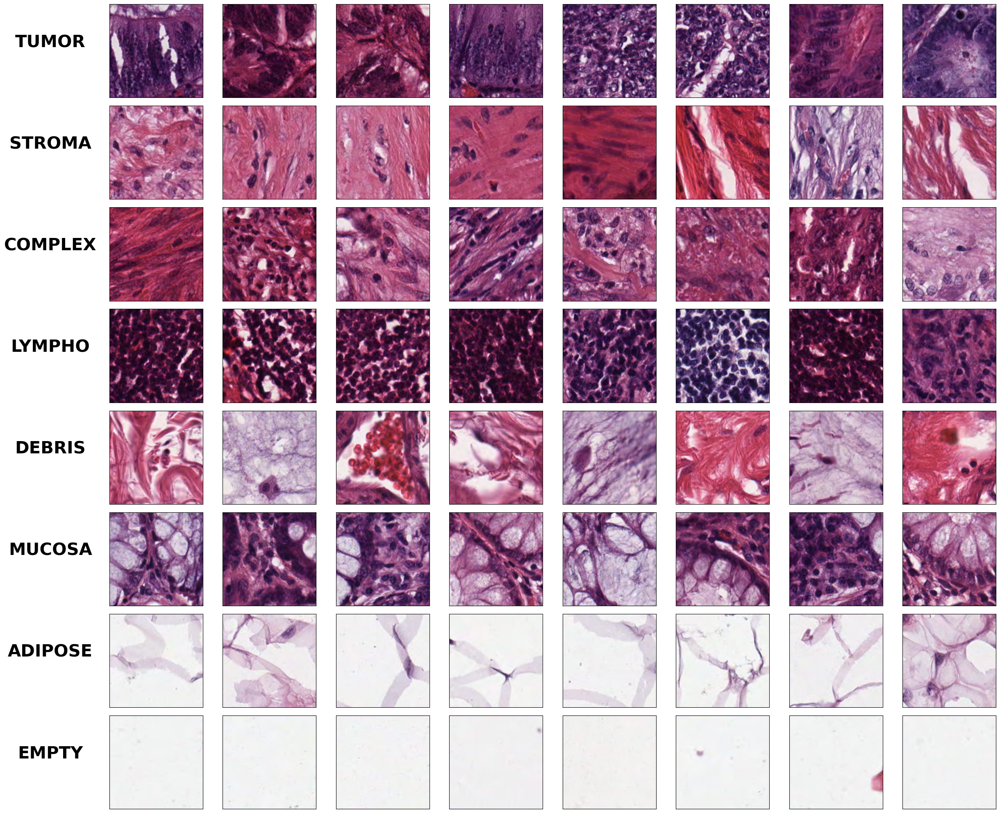

In [13]:
# Functions to plot several images 

# OpenCV loads color images in BGR mode. For visualization by matplotlib, images need to be converted to RGB mode
#!pip install opencv-python # If needed
import cv2
from glob import glob
def readImage_rgb(img_path):
    img_bgr = cv2.imread(img_path)
    img_rgb = cv2.cvtColor(img_bgr, cv2.COLOR_BGR2RGB)
    return img_rgb

img_labels = [i for i in os.listdir(SMALL_IMG_DATA_DIR) if not i.startswith('.')]

tumor_files = glob(os.path.join(SMALL_IMG_DATA_DIR, img_labels[0], '*.tif'))
stroma_files = glob(os.path.join(SMALL_IMG_DATA_DIR, img_labels[1], '*.tif'))
complex_files = glob(os.path.join(SMALL_IMG_DATA_DIR, img_labels[2], '*.tif'))
lympho_files = glob(os.path.join(SMALL_IMG_DATA_DIR, img_labels[3], '*.tif'))
debris_files = glob(os.path.join(SMALL_IMG_DATA_DIR, img_labels[4], '*.tif'))
mucosa_files = glob(os.path.join(SMALL_IMG_DATA_DIR, img_labels[5], '*.tif'))
adipose_files = glob(os.path.join(SMALL_IMG_DATA_DIR, img_labels[6], '*.tif'))
empty_files = glob(os.path.join(SMALL_IMG_DATA_DIR, img_labels[7], '*.tif'))

img_files = [
    tumor_files,
    stroma_files, 
    complex_files, 
    lympho_files, 
    debris_files, 
    mucosa_files, 
    adipose_files, 
    empty_files
]

# View several images from each class
def plotImage_cat(img_files, img_labels):
    fig = plt.figure(figsize=(25,20))
    for i in np.arange(len(img_labels)):
        img_paths = img_files[i]
        img_label = img_labels[i]
        np.random.shuffle(img_paths)
        img_paths = img_paths[:8]
        for j, img_path in enumerate(img_paths):
            fig.add_subplot(8,8,i*8+j+1, xticks = [], yticks = [])
            plt.imshow(readImage_rgb(img_path))
            if j == 0:
                plt.ylabel(img_label.split('_')[1], rotation = 0, labelpad=100, fontsize=30, fontweight = 'bold')
    plt.tight_layout()    
plotImage_cat(img_files, img_labels)

As we can see, we managed to display several images in a row of each class. Let's continue our exploration of the data by doing a statistical study on the images of each class.  

First, we will form a DataFrame with the paths of the images and the corresponding labels in order to use them for statistical studies. 

In [14]:
# Function to 
def image_summary(image_paths, img_label):

    # Create an empty dictionary
    img_dict = {}
    for i in range(len(image_paths)):
        img_path = image_paths[i]
        img_dict[img_path] = {}
        img = cv2.imread(img_path)
        img_dict[img_path]['label'] = img_label
        img_dict[img_path]['max'] = img.max()
        img_dict[img_path]['min'] = img.min()
    
        channel_mean = img.mean(axis = (0,1), keepdims = True).squeeze()
        channel_std = img.std(axis = (0,1), keepdims = True).squeeze()
        channel_q01 = np.quantile(img, 0.1, axis=(0,1), keepdims=True).squeeze()
        channel_q09 = np.quantile(img, 0.9, axis=(0,1), keepdims=True).squeeze()
        img_dict[img_path]['red_mean'], img_dict[img_path]['green_mean'], img_dict[img_path]['blue_mean'] = channel_mean
        img_dict[img_path]['red_std'], img_dict[img_path]['green_std'], img_dict[img_path]['blue_std'] = channel_std
        img_dict[img_path]['red_q01'], img_dict[img_path]['green_q01'], img_dict[img_path]['blue_q01'] = channel_q01
        img_dict[img_path]['red_q09'], img_dict[img_path]['green_q09'], img_dict[img_path]['blue_q09'] = channel_q09
        
    img_df = pd.DataFrame.from_dict(img_dict, orient = 'index')
    return img_df

In [15]:
# Turn in pdf 
tumor_files_df = image_summary(tumor_files, 'TUMOR')
stroma_files_df = image_summary(stroma_files, 'STROMA')
complex_files_df = image_summary(complex_files, 'COMPLEX')
lympho_files_df = image_summary(lympho_files, 'LYMPHO')
debris_files_df = image_summary(debris_files, 'DEBRIS')
mucosa_files_df = image_summary(mucosa_files, 'MUCOSA')
adipose_files_df = image_summary(adipose_files, 'ADIPOSE')
empty_files_df = image_summary(empty_files, 'EMPTY')

df = pd.concat([
    tumor_files_df, 
    stroma_files_df, 
    complex_files_df, 
    lympho_files_df, 
    debris_files_df, 
    mucosa_files_df, 
    adipose_files_df, 
    empty_files_df
])

In [16]:
# Let's have a look to the new dataframe created
df.head()

,label,max,min,red_mean,green_mean,blue_mean,red_std,green_std,blue_std,red_q01,green_q01,blue_q01,red_q09,green_q09,blue_q09
./data/Kather_texture_2016_image_tiles_5000\01_TUMOR\A26A_CRC-Prim-HE-05_008.tif_Row_151_Col_1.tif,TUMOR,-1,1,106.468489,59.769867,102.744133,43.961845,51.881891,50.082290,62.0,17.0,47.0,175.0,138.0,179.0
./data/Kather_texture_2016_image_tiles_5000\01_TUMOR\1735C_CRC-Prim-HE-07_025.tif_Row_1_Col_301.tif,TUMOR,-1,0,69.981289,34.046267,95.909289,33.330758,32.609101,46.177271,39.0,9.0,45.0,116.0,73.0,162.0
./data/Kather_texture_2016_image_tiles_5000\01_TUMOR\959_CRC-Prim-HE-07_025.tif_Row_1951_Col_601.tif,TUMOR,-1,0,81.361956,44.484889,114.646356,34.402702,35.021737,45.190794,45.0,14.0,57.0,122.0,81.0,173.0
./data/Kather_texture_2016_image_tiles_5000\01_TUMOR\2484_CRC-Prim-HE-05_007.tif_Row_1_Col_151.tif,TUMOR,-1,0,95.852489,45.141911,93.868711,25.169051,23.296716,32.274523,64.0,18.0,52.0,127.0,74.0,134.0
./data/Kather_texture_2016_image_tiles_5000\01_TUMOR\480_CRC-Prim-HE-05_024.tif_Row_151_Col_1.tif,TUMOR,-1,2,111.629067,62.090356,104.206711,38.749958,42.666965,46.728603,68.0,20.0,50.0,165.0,119.0,170.0


In [17]:
# Let's see the dataframe description
df.describe()

,max,min,red_mean,green_mean,blue_mean,red_std,green_std,blue_std,red_q01,green_q01,blue_q01,red_q09,green_q09,blue_q09
count,5000.000000,5000.000000,5000.000000,5000.000000,5000.000000,5000.000000,5000.000000,5000.000000,5000.000000,5000.000000,5000.000000,5000.000000,5000.000000,5000.000000
mean,-2.261600,3.530600,149.021602,120.444890,165.724198,32.687364,37.394919,36.259577,111.733600,80.722960,120.485220,192.686980,170.245340,212.302240
std,4.755638,35.691537,57.698439,72.193794,51.263512,16.364589,19.016687,17.776395,69.682041,82.299805,70.133412,44.975819,61.050057,31.717389
min,-66.000000,-128.000000,38.260711,19.504400,53.743022,0.971972,0.888076,0.896202,17.000000,5.000000,24.000000,63.000000,31.000000,99.000000
25%,-1.000000,0.000000,105.316689,64.500989,124.760700,23.477048,26.438023,25.983057,61.000000,21.000000,58.000000,156.750000,117.000000,192.750000
50%,-1.000000,4.000000,131.465133,92.044844,160.190644,34.453753,38.824807,39.725139,82.000000,39.000000,104.000000,200.000000,174.000000,218.000000
75%,-1.000000,14.000000,211.379856,197.407267,216.681911,44.985158,51.347413,49.031516,168.000000,134.000000,173.000000,241.000000,239.000000,243.000000
max,-1.000000,127.000000,243.896844,244.455778,243.653289,84.855213,97.188613,81.882078,242.000000,243.000000,242.000000,247.000000,247.000000,248.000000


We will check the pixel values of the images. Those which have a very low pixel i.e. black and those which have a very high pixel

In [18]:
# convert to csv format the dataframe
df.to_csv('Kather_texture_2016_image_tiles_5000.csv', index_label = 'img_id')
df = pd.read_csv('Kather_texture_2016_image_tiles_5000.csv', index_col = 'img_id')

In [19]:
# Look images with low and high pixel
# View their associated label
images_with_low_pixel = df[df['max'] < 30].index
images_with_high_pixel = df[df['min'] > 225].index

In [20]:
# Print the result of above computation
print('Number of images with low pixel: {}'.format(len(images_with_low_pixel)))
print('Number of images with very high pixel: {}'.format(len(images_with_high_pixel)))

Number of images with low pixel: 5000
Number of images with very high pixel: 0


We have no images with very low pixel values, so no dark images. On the other hand we have images that are very bright. Let's see where these images come from. 

In [21]:
#images_with_high_pixel_label = df[df['min'] > 225].label.value_counts().index.item()
#print('Very high pixel images are from {} class'.format(images_with_high_pixel_label))

The images that have a very pronounced pixel value come from the EMPTY class. This is quite reasonable because these images usually have a bright field with high intensity values. Now we will compare the average pixel intensity distribution for each class of images.

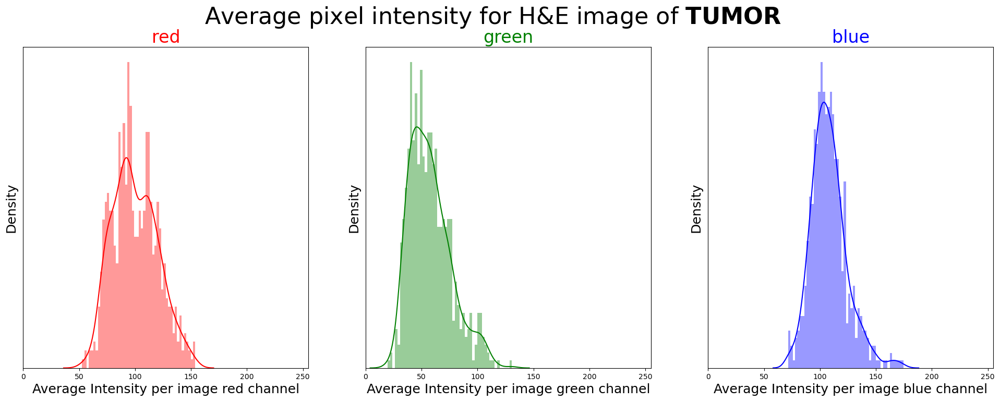

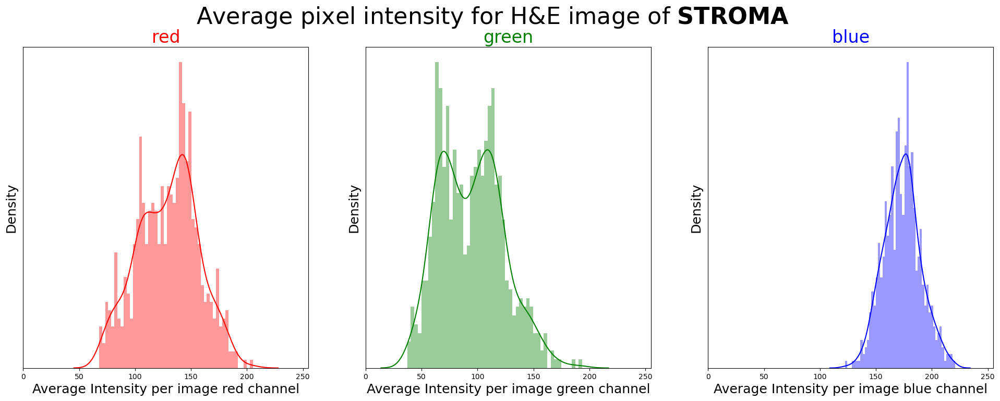

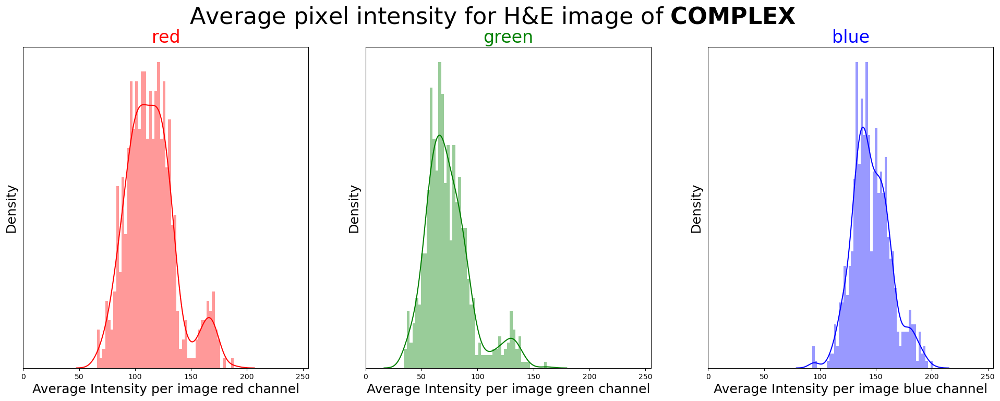

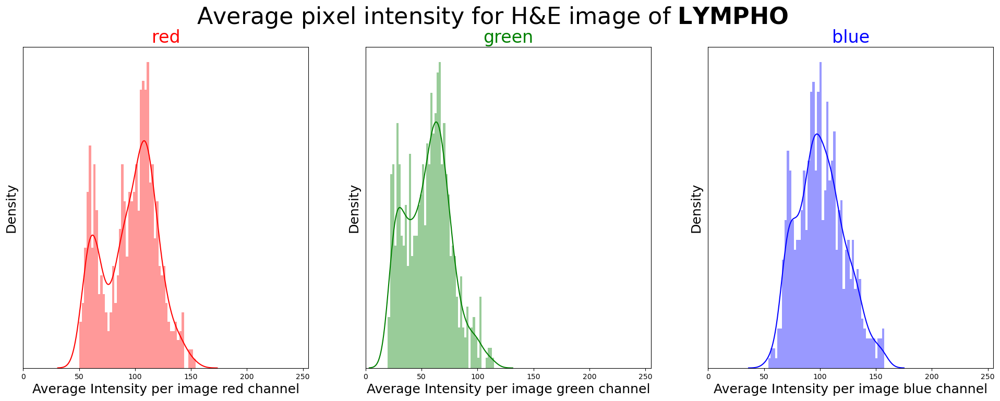

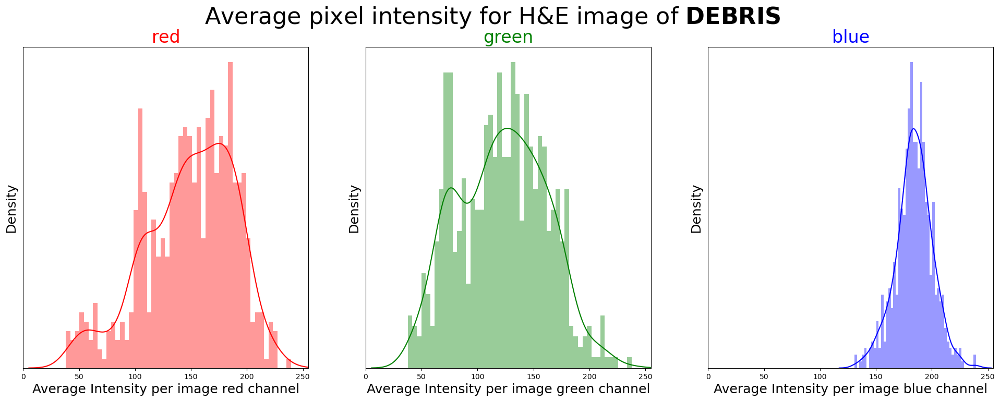

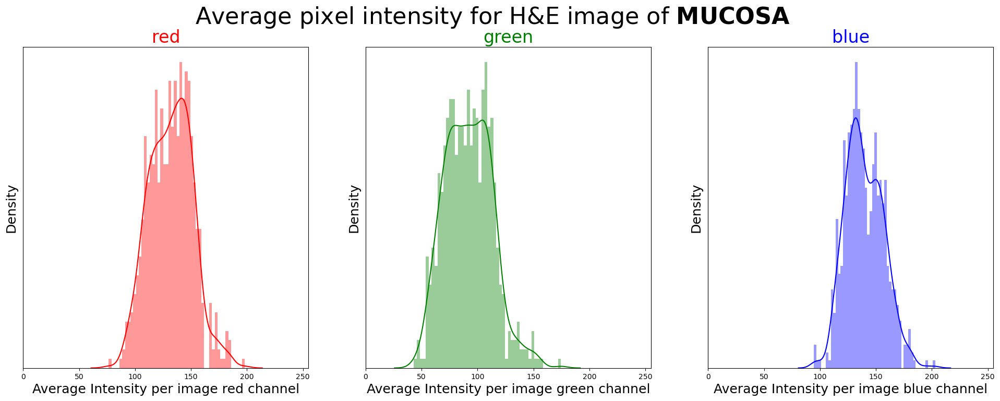

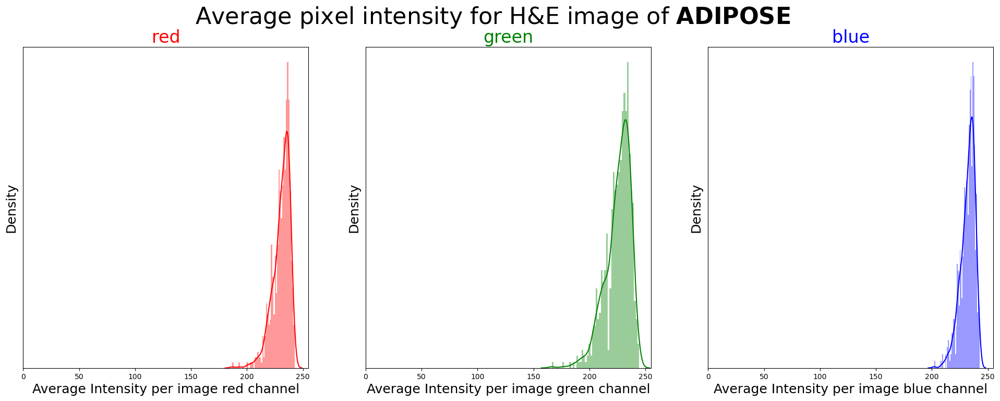

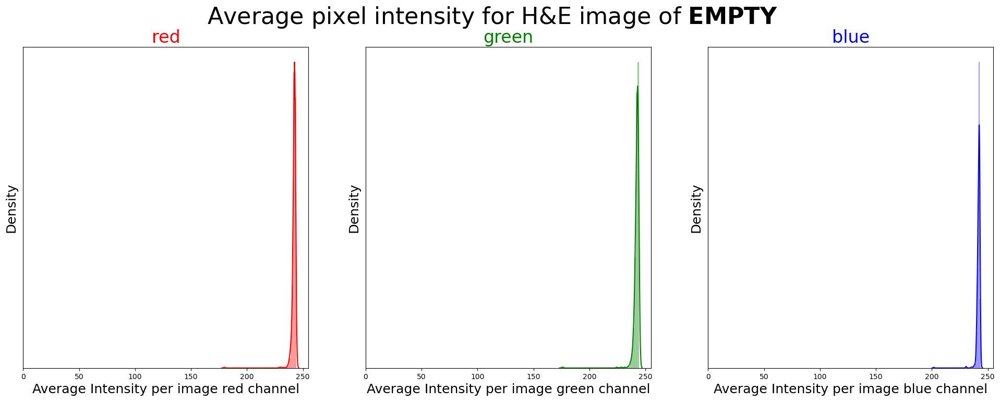

In [22]:
import seaborn as sns
def plotPixel_average(img_label):
    col = ['red', 'green', 'blue']
    col_mean = ['red_mean', 'green_mean', 'blue_mean']
    fig, ax = plt.subplots(1,3,figsize=(24,8))
    for i in np.arange(3):
        sns.distplot(df[df.label == img_label][col_mean[i]], bins = 50, color=col[i], ax = ax[i])
        ax[i].set_title(col[i], color=col[i], fontsize=24)
        ax[i].set_xlabel('Average Intensity per image {} channel'.format(col[i]), fontsize=18)
        ax[i].set_ylabel('Density', fontsize=18)
        ax[i].set_xlim(0,255)
        ax[i].set_yticks([])
    fig.suptitle("Average pixel intensity for H&E image of " + r"$\bf{" + str(img_label) + "}$", fontsize = 32)

for i in np.arange(8):
    plotPixel_average(img_labels[i].split('_')[1])

### Mini-conclusion: 
As can be seen the classes "ADIPOSE" and "EMPTY" have very distinct intensity distributions that are automatically distinguished from the others. To better compare the intensity of the pixels of the other 6 classes, let's combine the density distributions of the pixels of each class to plot them in a single graph to see what conclusion we can make. 

Text(0.5, 0.98, 'Average pixel intensity distributions for TUMOR, STROMA, COMPLEX, LYMPHO, DEBRIS and MUCOSA')

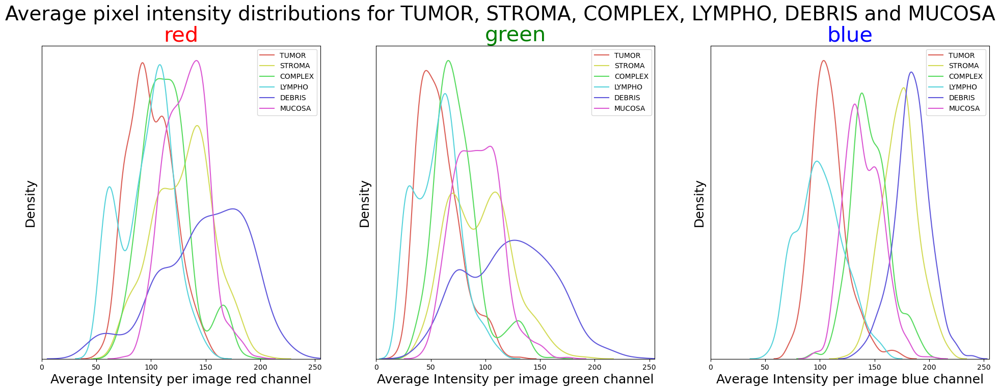

In [23]:
palette = sns.color_palette('hls', 6)
col = ['red', 'green', 'blue']
col_mean = ['red_mean', 'green_mean', 'blue_mean']
fig, ax = plt.subplots(1,3, figsize=(24,8))
for i in np.arange(3):
    for j in np.arange(6):
        label = img_labels[j].split('_')[1]
        sns.distplot(df[df.label == label][col_mean[i]], hist = False, bins=50, color = palette[j], label = label, ax = ax[i])
    ax[i].set_title(col[i], color = col[i], fontsize=30)
    ax[i].set_xlabel('Average Intensity per image {} channel'.format(col[i]), fontsize=18)
    ax[i].set_ylabel('Density', fontsize=18)
    ax[i].set_xlim(0,255)
    ax[i].set_yticks([])
    ax[i].legend()
fig.suptitle('Average pixel intensity distributions for TUMOR, STROMA, COMPLEX, LYMPHO, DEBRIS and MUCOSA', fontsize=28)

By combining the pixel intensity distributions of the other 6 classes and averaging, we can see a large variation between the different sample classes. Indeed:

- La classe "EMPTY" présente un pic d'intensité élevé et net, ce qui correspond à la notion de région " vide ".
- The "ADIPOSE" class has a similar intensity distribution to the EMPTY class. After some research, we realized that this is due to the fact that adipose tissue cells are accumulated with fat/lipids in the cytoplasm. The fat is dissolved during H&E staining and gives the cells an "empty" appearance. Due to the existence of the remaining cytoplasm and nucleus, the intensity shows a wider distribution compared to the "EMPTY" class, but the overall intensity is much brighter and more homogeneous compared to the other classes.
- The "DEBRIS" class has a very broad intensity distribution in the red and green channels, which corresponds to a high heterogeneity of debris. However, it has a very high intensity with a normal distribution in the blue channel compared to the majority of the other classes.

In conclusion, we can say that each class type has a distinct intensity distribution pattern that can provide additional information about image classification and help improve prediction accuracy.

Let's see what happens to the standard deviation of pixel intensity when we combine these same classes (TUMOR, STROMA, COMPLEX, LYMPHO, DEBRIS and MUCOSA)

Text(0.5, 0.98, 'Standard deviation of pixel intensity for TUMOR, STROMA, COMPLEX, LYMPHO, DEBRIS and MUCOSA')

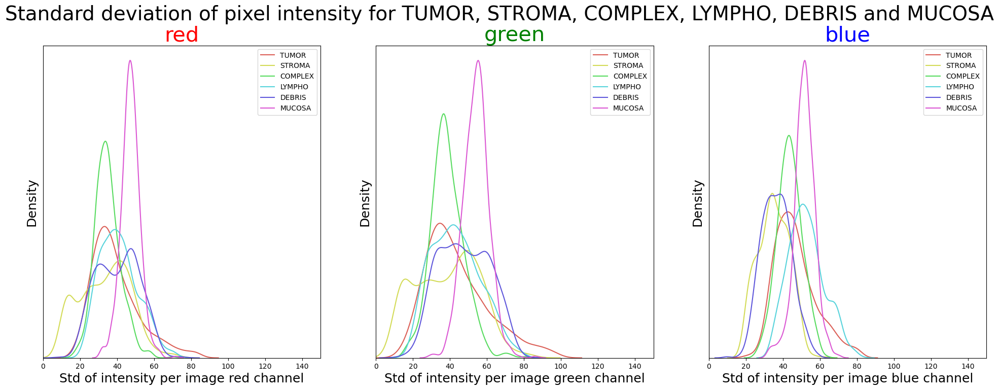

In [24]:
palette = sns.color_palette('hls', 6)
col = ['red', 'green', 'blue']
col_std = ['red_std', 'green_std', 'blue_std']
fig, ax = plt.subplots(1,3, figsize=(24,8))
for i in np.arange(3):
    for j in np.arange(6):
        label = img_labels[j].split('_')[1]
        sns.distplot(df[df.label == label][col_std[i]], hist = False, bins=50, color = palette[j], label = label, ax = ax[i])
    ax[i].set_title(col[i], color = col[i], fontsize=30)
    ax[i].set_xlabel('Std of intensity per image {} channel'.format(col[i]), fontsize=18)
    ax[i].set_ylabel('Density', fontsize=18)
    ax[i].set_xlim(0,150)
    ax[i].set_yticks([])
    ax[i].legend()
fig.suptitle('Standard deviation of pixel intensity for TUMOR, STROMA, COMPLEX, LYMPHO, DEBRIS and MUCOSA', fontsize=28)

The observation of the standard deviation of the pixel intensities of the 6 classes confirms the conclusions drawn from the distribution of the mean pixel intensity. We can see that the "EMPTY" and "ADIPOSE" classes have the most homogeneous texture, while the "DEBRIS" and "MUCOSA" classes have a relatively higher heterogeneity.

# Building a model: CNN

Now at this point, we will implement a model. The model chosen is the one based on convolution networks (CNN). 

### 1. Image pre-processing and data loading

Before training the model, we will split the dataset into training, validation, and test datasets. I chose to use the split ratio of 0.7 for training, 0.15 for validation, and 0.15 for testing. Then, I choose to randomly assign each image to one of the three datasets.

In [25]:
train_valid_test_df = df.copy()

total_num = train_valid_test_df.shape[0]
split1 = int(total_num*0.7)
split2 = int(total_num*0.85)
indices = np.arange(total_num)

np.random.seed(123)
np.random.shuffle(indices)
train_idx, val_idx, test_idx = indices[:split1], indices[split1:split2], indices[split2:]

In [26]:
# Stratify images using SubsetRandomSampler from torch.utils.data.sampler
from torch.utils.data.sampler import SubsetRandomSampler

train_sampler = SubsetRandomSampler(train_idx)
val_sampler = SubsetRandomSampler(val_idx)
test_sampler = SubsetRandomSampler(test_idx)

First, we will perform a transformation of the images. First, we will resize the images. Currently, they are a uniform size of 150x150px. In order to facilitate the process of forming the CNN, the images will be resized to 144x144px.

Then, to avoid excessive adjustment, the following image augmentations will be applied:
- Random rotation i.e., make a random horizontal/vertical flip. Augmentation will be applied to the training and validation datasets to make random changes. And during the validation process, the predictions will be based on the augmented images.
- A normalization of the pixel values in the range [-1, 1]. This is to ensure that all features have the same range and contribute equally to the model. 

In [27]:
train_transforms = transforms.Compose([
    transforms.RandomRotation(10),
    transforms.RandomResizedCrop(144),
    transforms.RandomHorizontalFlip(p=0.5),
    transforms.RandomVerticalFlip(p=0.5),
    transforms.ToTensor(),
    transforms.Normalize([0.5,0.5,0.5], [0.5,0.5,0.5])
])

In [28]:
from torchvision import datasets, transforms
BATCH_SIZE = 32
train_path = SMALL_IMG_DATA_DIR
train_data = datasets.ImageFolder(train_path, transform = train_transforms)

train_loader = torch.utils.data.DataLoader(train_data, batch_size=BATCH_SIZE, sampler = train_sampler)
val_loader = torch.utils.data.DataLoader(train_data, batch_size=BATCH_SIZE, sampler = val_sampler)
test_loader = torch.utils.data.DataLoader(train_data, batch_size = BATCH_SIZE, sampler = test_sampler)

print('Number of images in training set: {}'.format(len(train_loader.sampler)))
print('Number of images in validation set: {}'.format(len(val_loader.sampler)))
print('Number of images in testing set: {}'.format(len(test_loader.sampler)))

Number of images in training set: 3500
Number of images in validation set: 750
Number of images in testing set: 750


Once the images pre-processing was done, we are now able to visualize the images after the transformations done.

Text(0.5, 0.98, 'Images after the pre-processing')

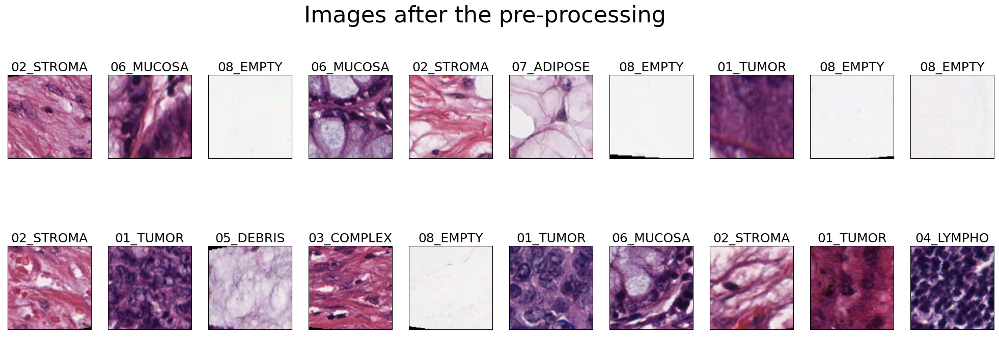

In [29]:
def imshow_transform(img):
    '''visualize images post augmentation'''
    img = img*0.5+0.5
    plt.imshow(np.transpose(img, (1,2,0)))

images, labels = next(iter(train_loader))
images = images.numpy().squeeze()
classes = train_data.classes
palette = sns.color_palette('tab10', 8)

fig = plt.figure(figsize = (25,8))
for idx in np.arange(20):
    ax = fig.add_subplot(2,10,idx+1,xticks=[], yticks=[])
    imshow_transform(images[idx])
    ax.set_title(classes[labels.numpy()[idx]], fontsize=18)
fig.suptitle('Images after the pre-processing', fontsize = 32)

### 2. CNN built from scratch

We now implement the CNN neural network. To avoid overfitting, we apply the nn.Dropout method to the MaxPooling layer after each convolutional layer stack as well as the first fully connected layer.  This method returns a tensor after replacing some elements of the input tensor with 0 with a given probability P. And here, P is set to 0.3, which suggests that at each forward pass, each node will be randomly dropped with probability 0.3

In [30]:
class Model(nn.Module):
    def __init__(self):
        super(Model,self).__init__()
        self.conv1_1 = nn.Conv2d(3,32,3,padding=1)
        self.conv1_2 = nn.Conv2d(32,32,3,padding=1)
        self.conv1_3 = nn.Conv2d(32,32,3,padding=1)

        self.conv2_1 = nn.Conv2d(32,64,3,padding=1)
        self.conv2_2 = nn.Conv2d(64,64,3,padding=1)
        self.conv2_3 = nn.Conv2d(64,64,3,padding=1)

        self.conv3_1 = nn.Conv2d(64,128,3,padding=1)
        self.conv3_2 = nn.Conv2d(128,128,3,padding=1)
        self.conv3_3 = nn.Conv2d(128,128,3,padding=1)

        self.pool = nn.MaxPool2d(2,2)
        self.fc1 = nn.Linear(128*18*18,256)
        self.fc2 = nn.Linear(256,8)
        self.dropout = nn.Dropout(0.3)

    def forward(self, x):
        x = F.relu(self.conv1_1(x))
        x = F.relu(self.conv1_2(x))
        x = F.relu(self.conv1_3(x))
        x = self.pool(x)
        x = self.dropout(x)

        x = F.relu(self.conv2_1(x))
        x = F.relu(self.conv2_2(x))
        x = F.relu(self.conv2_3(x))
        x = self.pool(x)
        x = self.dropout(x)

        x = F.relu(self.conv3_1(x))
        x = F.relu(self.conv3_2(x))
        x = F.relu(self.conv3_3(x))
        x = self.pool(x)
        x = self.dropout(x)

        x = x.view(-1,128*18*18)
        x = self.dropout(F.relu(self.fc1(x)))
        x = self.fc2(x)

        return x

### 3. Train the CNN model

The use of a GPU is recommended to significantly speed up the training process for this project given its complexity. 

In [31]:
print(torch.version.cuda)

None


In [32]:
torch.cuda.is_available()

False

In [33]:
set_device = torch.device('cuda:0' if torch.cuda.is_available() else 'cpu')
print('device: {}'.format(set_device.type))

device: cpu


Also, in order to avoid overfitting, the following training function has training and validation phases. The function trains images in the training dataset for the specified epochs (one epoch: one cycle through the entire training dataset) and after each epoch, performs a full validation step. After each epoch, the output of the loss function as well as the accuracy of the prediction is computed for the training and validation datasets, stored as train_loss, train_acc, val_loss and val_acc.

We save the model with the lowest loss of value. The training process nevertheless goes through the specified number of epochs n_epochs. This allows us to understand how the train_loss, train_acc, val_loss, and val_acc values change after each epoch in order to refine the hyperparameters to improve training performance. 

In [34]:
from torch import optim
model_cnn = Model()
# specify loss function
criterion = nn.CrossEntropyLoss()
# specify optimizer
optimizer = optim.Adam(model_cnn.parameters(), lr=0.0001)

In [35]:
def train(n_epochs, train_loader, val_loader, model, criterion, optimizer, device, save_path):
    '''the train function will perform both forward and backpropagation on training and validation datasets.
    Output: trained model with the lowest val_loss and dataframe containing train_loss/train_acc and val_loss/val_acc for each epoch'''
    epoch_dict={}
    valid_loss_min = np.Inf
    model = model_cnn.to(device)
    for epoch in np.arange(n_epochs):
        # Initiate loss and accuracy values
        train_loss = 0.0
        train_acc = 0.0
        val_loss = 0.0
        val_acc = 0.0
        epoch_dict[epoch] = {}
        # Training
        model.train()
        for images, labels in train_loader:
            optimizer.zero_grad()
            images, labels = images.to(device), labels.to(device)
            output = model(images)
            loss = criterion(output, labels)
            loss.backward()
            optimizer.step()
            ## Update loss and acc values for the training process
            train_loss += loss.item()*images.shape[0]
            _, top_class = output.topk(1,dim=1)
            equals = top_class == labels.view(*top_class.shape)
            train_acc += torch.mean(equals.type(torch.FloatTensor)).item()

        # Validation
        else:
            # turn off gradients
            with torch.no_grad():
                # set model to evaluation mode
                model.eval()
                for images, labels in val_loader:
                    images, labels = images.to(device), labels.to(device)
                    output = model(images)
                    loss = criterion(output, labels)
                    ## Update loss and acc values for the validation process
                    val_loss += loss.item()*images.shape[0]
                    _, top_class = output.topk(1,dim=1)
                    equals = top_class == labels.view(*top_class.shape)
                    val_acc += torch.mean(equals.type(torch.FloatTensor)).item()

                ### write training/validation loss/accuracy
                epoch_dict[epoch]['Train_Loss'] = train_loss/len(train_loader.sampler)
                epoch_dict[epoch]['Train_Accuracy'] = train_acc/len(train_loader)
                epoch_dict[epoch]['Val_Loss'] = val_loss/len(val_loader.sampler)
                epoch_dict[epoch]['Val_Accuracy'] = val_acc/len(val_loader)

                print("Epoch: {}/{}.. ".format(epoch+1, n_epochs),
                      "Train Loss: {:.3f}.. ".format(train_loss/len(train_loader.sampler)),
                      "Train Accuracy: {:.3f}.. ".format(train_acc/len(train_loader)),
                      "Validation Loss: {:.3f}.. ".format(val_loss/len(val_loader.sampler)),
                      "Validation Accuracy: {:.3f}".format(val_acc/len(val_loader)))
                
                ## save the model with the lowest val_loss and update valid_loss_min
                if val_loss <= valid_loss_min:
                    print('Validation loss decreased -- Saving model -- \n')
                    torch.save(model.state_dict(), save_path)
                    valid_loss_min = val_loss

    epoch_df = pd.DataFrame.from_dict(epoch_dict, orient = 'index')
    epoch_df['Epoch'] = np.arange(n_epochs)+1
    return model, epoch_df


In [36]:
n_epochs = 25
save_path = 'model/25_epochs.pth'
model, epoch_df = train  (
    n_epochs, 
    train_loader, 
    val_loader, 
    model_cnn, 
    criterion, 
    optimizer, 
    device, 
    save_path
)

Epoch: 1/25..  Train Loss: 1.719..  Train Accuracy: 0.274..  Validation Loss: 1.172..  Validation Accuracy: 0.457
Validation loss decreased -- Saving model -- 

Epoch: 2/25..  Train Loss: 1.131..  Train Accuracy: 0.467..  Validation Loss: 1.048..  Validation Accuracy: 0.510
Validation loss decreased -- Saving model -- 

Epoch: 3/25..  Train Loss: 1.049..  Train Accuracy: 0.522..  Validation Loss: 0.943..  Validation Accuracy: 0.632
Validation loss decreased -- Saving model -- 

Epoch: 4/25..  Train Loss: 1.006..  Train Accuracy: 0.562..  Validation Loss: 0.906..  Validation Accuracy: 0.636
Validation loss decreased -- Saving model -- 

Epoch: 5/25..  Train Loss: 0.960..  Train Accuracy: 0.581..  Validation Loss: 0.887..  Validation Accuracy: 0.640
Validation loss decreased -- Saving model -- 

Epoch: 6/25..  Train Loss: 0.944..  Train Accuracy: 0.606..  Validation Loss: 0.822..  Validation Accuracy: 0.696
Validation loss decreased -- Saving model -- 

Epoch: 7/25..  Train Loss: 0.906..

### 4. Visualization of traning results

Text(0.5, 1.0, 'Training and Validation Accuracy')

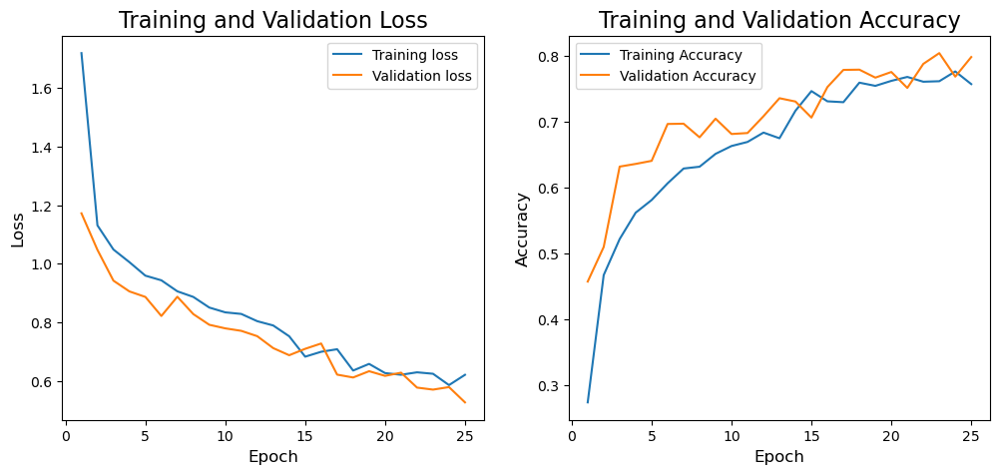

In [37]:
plt.figure(figsize=(12,5))
plt.subplot(1,2,1)
plt.plot(epoch_df.Epoch, epoch_df.Train_Loss, label = 'Training loss')
plt.plot(epoch_df.Epoch, epoch_df.Val_Loss, label = 'Validation loss')
plt.xlabel('Epoch', fontsize=12)
plt.ylabel('Loss', fontsize=12)
plt.legend()
plt.title('Training and Validation Loss', fontsize=16)

plt.subplot(1,2,2)
plt.plot(epoch_df.Epoch, epoch_df.Train_Accuracy, label = 'Training Accuracy')
plt.plot(epoch_df.Epoch, epoch_df.Val_Accuracy, label = 'Validation Accuracy')
plt.xlabel('Epoch', fontsize=12)
plt.ylabel('Accuracy', fontsize=12)
plt.legend()
plt.title('Training and Validation Accuracy', fontsize=16)

### 5. Loading of the trained model and images from the test dataset

We found it necessary that in addition to calculating the overall prediction accuracy of the test dataset, it is also important to know which images are classified correctly or incorrectly for future improvement and better interpretation of the classification results. To do this, we load the trained model and use a modified torchvision.datasets.ImageFolder to load the images with their path information.

Reference: https://gist.github.com/andrewjong/6b02ff237533b3b2c554701fb53d5c4d

In [38]:
model_cnn = Model()
if device.type == 'cpu':
    state_dict = torch.load('model/25_epochs.pth', map_location='cpu')
else:
    state_dict = torch.load('model/25_epochs.pth')
model.load_state_dict(state_dict)
for param in model.parameters():
    param.requires_grad=False

In [39]:
class ImageFolderWithPaths(datasets.ImageFolder):
    """Custom dataset that includes image file paths. Extends
    torchvision.datasets.ImageFolder
    """
    # override the __getitem__ method. this is the method dataloader calls
    def __getitem__(self, index):
        # this is what ImageFolder normally returns 
        original_tuple = super(ImageFolderWithPaths, self).__getitem__(index)
        # the image file path
        path = self.imgs[index][0]
        # make a new tuple that includes original and the path
        tuple_with_path = (original_tuple + (path,))
        return tuple_with_path

In [40]:
# Without any augmentation
test_transforms = transforms.Compose([
    transforms.Resize((144,144)),
    transforms.ToTensor(),
    transforms.Normalize([0.5,0.5,0.5], [0.5,0.5,0.5])
])
test_data = ImageFolderWithPaths(train_path, transform = test_transforms)
test_loader = torch.utils.data.DataLoader(test_data, batch_size = BATCH_SIZE, sampler = test_sampler)
print('Number of images in testing set: {}'.format(len(test_loader.sampler)))

Number of images in testing set: 750


### 6. Prediction on the test dataset 

In [41]:
def model_eval(test_loader, model, criterion, device, classes):
    '''Apply the trained model to testing dataset and summarize the overall test_loss/test_acc
    also output testing accuracy for each category and the prediction result for each sample as well as the probability'''
    # Initiate loss and accuracy values
    test_loss = 0.0
    test_acc = 0.0
    class_correct = list(0. for i in range(len(classes)))
    class_total = list(0. for i in range(len(classes)))
  
    dt = np.dtype(int)
    true_label = np.array([], dtype = dt)
    pred_label = np.array([], dtype = dt)
    path_array = np.array([])
    prob_array = np.array([])
    probs_array = np.array(classes).reshape(1,-1)
    
    model = model.to(device)
    with torch.no_grad():
        model.eval()
        for images, labels, paths in test_loader:
            path_array = np.append(path_array, np.array(paths))
            images, labels = images.to(device), labels.to(device)
            output = model(images)
            loss = criterion(output, labels)
            test_loss += loss.item()*images.shape[0]
        
            softmax = nn.Softmax(dim=1)
            output_softmax = softmax(output)
            top_probs, preds = output_softmax.topk(1,dim=1)
            equals = preds == labels.view(*preds.shape)
            correct = np.squeeze(equals)
            test_acc += torch.mean(equals.type(torch.FloatTensor)).item()
            for i in range(len(images)):
                label = labels[i].item()
                class_correct[label] += correct[i].item()
                class_total[label] += 1

            if device.type == 'cpu':
                true_label = np.append(true_label, labels)
                pred_label = np.append(pred_label, preds)
                prob_array = np.append(prob_array, top_probs)
                probs_array = np.concatenate((probs_array, output_softmax))
      
            else:
                true_label = np.append(true_label, labels.cpu())
                pred_label = np.append(pred_label, preds.cpu())
                prob_array = np.append(prob_array, top_probs.cpu())
                probs_array = np.concatenate((probs_array, output_softmax.cpu()))
            
      
    test_loss = test_loss/len(test_loader.sampler)
    test_acc = test_acc/len(test_loader)
    print('Test Loss: {:.6f}\n'.format(test_loss))
    print('Test Accuracy (Overall): {:.3f}%  ({}/{})\n'.format(np.sum(class_correct)/np.sum(class_total)*100, np.sum(class_correct), np.sum(class_total)))
  
    for i in range(len(classes)):
        if class_total[i] > 0:
            print('Test Accuracy of {}: {:.3f}% ({}/{})'.format(classes[i], class_correct[i]/class_total[i]*100,class_correct[i], class_total[i]))
        else:
            print('Test Accuracy of {}: N/A'.format(classes[i]))
    summary_df = pd.DataFrame({'category': classes, 'correct': class_correct, 'total': class_total})
    pred_df = pd.DataFrame({'file_path': path_array, 'true_label': true_label, 'prediction': pred_label, 'prob': prob_array})
    probs_df = pd.DataFrame(probs_array[1:], columns = probs_array[0])
    probs_df['file_path'] = path_array
    pred_df = pred_df.merge(probs_df, left_on = 'file_path', right_on = 'file_path')
    return summary_df, pred_df

In [42]:
criterion = nn.CrossEntropyLoss()
classes = test_data.classes
summary_df, pred_df = model_eval(test_loader, model, criterion, device, classes)

Test Loss: 0.456815

Test Accuracy (Overall): 83.467%  (626.0/750.0)

Test Accuracy of 01_TUMOR: 94.318% (83.0/88.0)
Test Accuracy of 02_STROMA: 56.098% (46.0/82.0)
Test Accuracy of 03_COMPLEX: 83.158% (79.0/95.0)
Test Accuracy of 04_LYMPHO: 77.660% (73.0/94.0)
Test Accuracy of 05_DEBRIS: 77.000% (77.0/100.0)
Test Accuracy of 06_MUCOSA: 79.167% (76.0/96.0)
Test Accuracy of 07_ADIPOSE: 100.000% (97.0/97.0)
Test Accuracy of 08_EMPTY: 96.939% (95.0/98.0)


### 7. Model performance

We will now evaluate the evalution of our model. To achieve our goal, we will use the confusion matrix which is a kind of summary of the prediction results for a particular classification problem. It compares the actual data for a target variable with those predicted by a model. The correct and false predictions are revealed and divided by class, allowing them to be compared with defined values. 

In [43]:
cm = confusion_matrix(pred_df.true_label, pred_df.prediction)


def plot_confusion_matrix(cm, classes,title='Confusion matrix',cmap=plt.cm.Blues):    
    plt.figure(figsize=(10,10))
    plt.imshow(cm, interpolation='nearest', cmap=cmap)
    plt.title(title, fontsize=26)
    plt.colorbar()
    tick_marks = np.arange(len(classes))
    plt.xticks(tick_marks, classes, rotation=45, fontsize=12, fontweight='bold')
    plt.yticks(tick_marks, classes, fontsize=12, fontweight='bold')

    thresh = cm.max() / 2.
    for i, j in itertools.product(range(cm.shape[0]), range(cm.shape[1])):
        plt.text(j, i, '{:d} \n({:.2f}%)'.format(cm[i, j], cm[i,j]/cm.sum()*100), horizontalalignment="center", color="white" if cm[i, j] > thresh else "black")

    plt.ylabel('True label', fontsize=20)
    plt.xlabel('Predicted label', fontsize=20)
    plt.tight_layout()

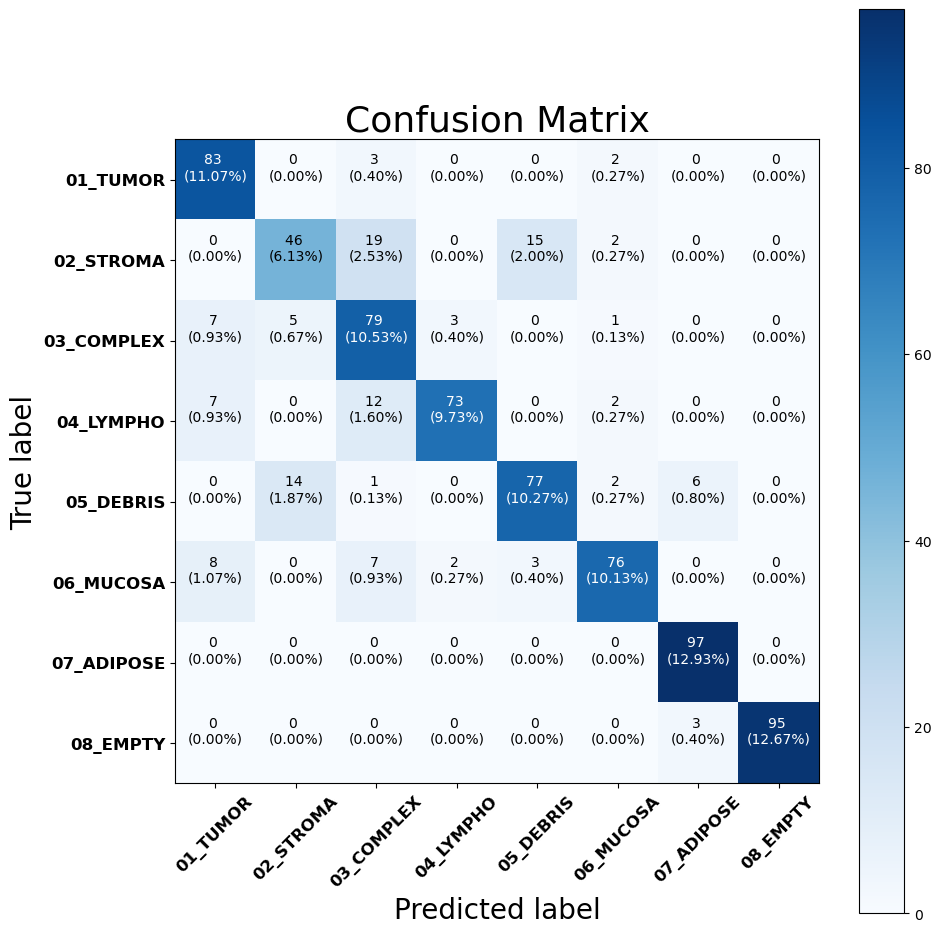

In [44]:

plot_confusion_matrix(cm, classes, title = 'Confusion Matrix')

# Transfert Learning

The CNN network constructed in this way provides a performance that is not very optimal. This could be explained by the fact that we have a small dataset available for this study (5000 images). One method to overcome the limitation of this small dataset would be to employ transfer learning to use a ConvNet pre-trained on a very large dataset (e.g. ImageNet). 

To do this, we will use Inception-v3, a 42-layer deep network that uses inception modules as building blocks.

Reference: https://medium.com/@AnasBrital98/inception-v3-cnn-architecture-explained-691cfb7bba08


### 1. Load Inception_v3 pretrained model and replace classifiers

In [45]:
inception = models.inception_v3(pretrained=True)
print(inception.AuxLogits.fc)
print(inception.fc)
for param in inception.parameters():
    param.requires_grad = False

Linear(in_features=768, out_features=1000, bias=True)
Linear(in_features=2048, out_features=1000, bias=True)


When using the Inception-v3 model, we need to pay attention to the auxiliary classifier and the input size of the data. This is because Inception-v3 has an auxiliary classifier and the overall loss is calculated based on the auxiliary output and the final output. Thus, in addition to replacing the final classifier, the auxiliary classifier must also be replaced. The train function will be updated in the loss calculation step as a train_aux function. As for the input size of the data, unlike other pre-trained models that expect an input size of (224, 224), Inception_v3 requires an input size of (299,299).

In [46]:
## auxiliary classifier
inception.AuxLogits.fc = nn.Sequential(nn.Linear(inception.AuxLogits.fc.in_features, 8))
## final classifier
inception.fc = nn.Sequential(nn.Linear(inception.fc.in_features, 8))

In [47]:

train_transforms = transforms.Compose([
    transforms.RandomRotation(10),
    transforms.Resize((299,299)),
    transforms.RandomHorizontalFlip(p=0.5),
    transforms.RandomVerticalFlip(p=0.5),
    transforms.ToTensor(),
    transforms.Normalize([0.485, 0.456, 0.406], [0.229, 0.224, 0.225])
])

In [48]:
train_data = datasets.ImageFolder(train_path, transform = train_transforms)

train_loader = torch.utils.data.DataLoader(train_data, batch_size=BATCH_SIZE, sampler = train_sampler)
val_loader = torch.utils.data.DataLoader(train_data, batch_size=BATCH_SIZE, sampler = val_sampler)

### 2. Train the model 

The modifications to the previous train function are adjusted to add the calculation of the auxiliary output and the loss in the training phase as train_aux.

In [49]:
def train_aux(n_epochs, train_loader, val_loader, model, criterion, optimizer, device, save_path):
    '''train function specific for Inception_V3 to calcualte auxiliary output'''
    epoch_dict={}
    valid_loss_min = np.Inf
    model = model.to(device)
    for epoch in np.arange(n_epochs):
        # Initiate loss and accuracy values
        train_loss = 0.0
        train_acc = 0.0
        val_loss = 0.0
        val_acc = 0.0
        epoch_dict[epoch] = {}
        # Training
        model.train()
        for images, labels in train_loader:
            optimizer.zero_grad()
            images, labels = images.to(device), labels.to(device)
            # both final output and auxiliary output
            output, aux_output = model(images)
            loss1 = criterion(output, labels)
            loss2 = criterion(aux_output, labels)
            loss = loss1+0.4*loss2
            loss.backward()
            optimizer.step()
            # Update loss and acc values for the training process
            train_loss += loss.item()*images.shape[0]
            _, top_class = output.topk(1,dim=1)
            equals = top_class == labels.view(*top_class.shape)
            train_acc += torch.mean(equals.type(torch.FloatTensor)).item()

        # Validation
        else:
            with torch.no_grad():
                model.eval()
                for images, labels in val_loader:
                    images, labels = images.to(device), labels.to(device)
                    output = model(images)
                    loss = criterion(output, labels)
                    # Update loss and acc values for the validation process
                    val_loss += loss.item()*images.shape[0]
                    _, top_class = output.topk(1,dim=1)
                    equals = top_class == labels.view(*top_class.shape)
                    val_acc += torch.mean(equals.type(torch.FloatTensor)).item()

                # write training/validation loss/accuracy
                epoch_dict[epoch]['Train_Loss'] = train_loss/len(train_loader.sampler)
                epoch_dict[epoch]['Train_Accuracy'] = train_acc/len(train_loader)
                epoch_dict[epoch]['Val_Loss'] = val_loss/len(val_loader.sampler)
                epoch_dict[epoch]['Val_Accuracy'] = val_acc/len(val_loader)

                print("Epoch: {}/{}.. ".format(epoch+1, n_epochs),
                      "Train Loss: {:.3f}.. ".format(train_loss/len(train_loader.sampler)),
                      "Train Accuracy: {:.3f}.. ".format(train_acc/len(train_loader)),
                      "Validation Loss: {:.3f}.. ".format(val_loss/len(val_loader.sampler)),
                      "Validation Accuracy: {:.3f}".format(val_acc/len(val_loader)))
                if val_loss <= valid_loss_min:
                    print('\n Validation loss decreased -- Saving model -- \n')
                    torch.save(model.state_dict(), save_path)
                    valid_loss_min = val_loss

    epoch_df = pd.DataFrame.from_dict(epoch_dict, orient = 'index')
    epoch_df['Epoch'] = np.arange(n_epochs)+1
    return model, epoch_df

In [50]:
## Parameters from both the final classifier and the auxiliary classifier need to be trained
params = [inception.fc.parameters(), inception.AuxLogits.fc.parameters()]
criterion = nn.CrossEntropyLoss()
optimizer = optim.Adam(itertools.chain(*params), lr=0.0001)

In [51]:
n_epochs = 25
save_path = 'model/25_epochs_v3.pth'
inception, epoch_df = train_aux(
    n_epochs, train_loader, 
    val_loader, 
    inception, 
    criterion, 
    optimizer, 
    device, 
    save_path
)

Epoch: 1/25..  Train Loss: 2.614..  Train Accuracy: 0.303..  Validation Loss: 1.721..  Validation Accuracy: 0.583

 Validation loss decreased -- Saving model -- 

Epoch: 2/25..  Train Loss: 2.093..  Train Accuracy: 0.572..  Validation Loss: 1.449..  Validation Accuracy: 0.750

 Validation loss decreased -- Saving model -- 

Epoch: 3/25..  Train Loss: 1.759..  Train Accuracy: 0.681..  Validation Loss: 1.217..  Validation Accuracy: 0.808

 Validation loss decreased -- Saving model -- 

Epoch: 4/25..  Train Loss: 1.538..  Train Accuracy: 0.730..  Validation Loss: 1.092..  Validation Accuracy: 0.807

 Validation loss decreased -- Saving model -- 

Epoch: 5/25..  Train Loss: 1.391..  Train Accuracy: 0.736..  Validation Loss: 0.985..  Validation Accuracy: 0.819

 Validation loss decreased -- Saving model -- 

Epoch: 6/25..  Train Loss: 1.279..  Train Accuracy: 0.759..  Validation Loss: 0.906..  Validation Accuracy: 0.846

 Validation loss decreased -- Saving model -- 

Epoch: 7/25..  Train L

### 3. Model performance and confusion matrix

Text(0.5, 1.0, 'Training and Validation Accuracy')

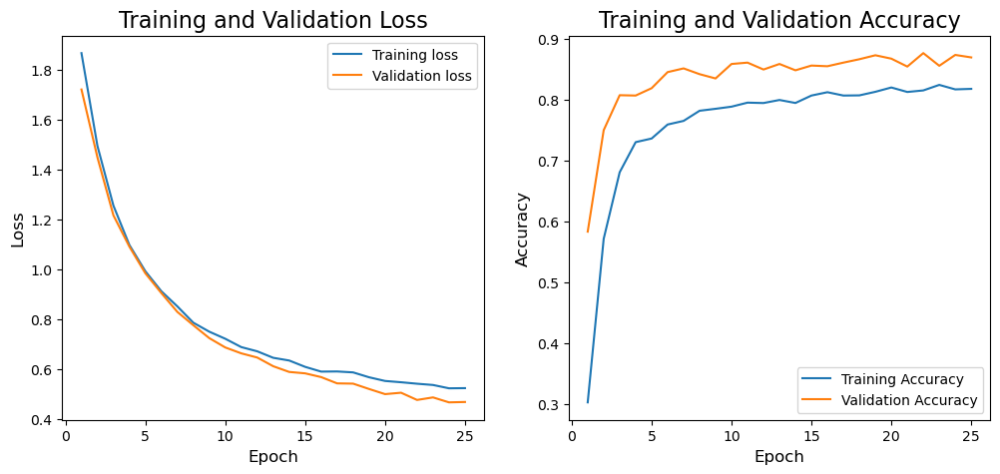

In [52]:
plt.figure(figsize=(12,5))
plt.subplot(1,2,1)
plt.plot(epoch_df.Epoch, epoch_df.Train_Loss/1.4, label = 'Training loss')
plt.plot(epoch_df.Epoch, epoch_df.Val_Loss, label = 'Validation loss')
plt.xlabel('Epoch', fontsize=12)
plt.ylabel('Loss', fontsize=12)
plt.legend()
plt.title('Training and Validation Loss', fontsize=16)

plt.subplot(1,2,2)
plt.plot(epoch_df.Epoch, epoch_df.Train_Accuracy, label = 'Training Accuracy')
plt.plot(epoch_df.Epoch, epoch_df.Val_Accuracy, label = 'Validation Accuracy')
plt.xlabel('Epoch', fontsize=12)
plt.ylabel('Accuracy', fontsize=12)
plt.legend()
plt.title('Training and Validation Accuracy', fontsize=16)

In [53]:
inception = models.inception_v3(pretrained=True)
inception.AuxLogits.fc = nn.Sequential(nn.Linear(inception.AuxLogits.fc.in_features, 8))
inception.fc = nn.Sequential(nn.Linear(inception.fc.in_features, 8))
if device.type == 'cpu':
    state_dict = torch.load('model/25_epochs_v3.pth', map_location='cpu')
else:
    state_dict = torch.load('model/25_epochs_v3.pth')
inception.load_state_dict(state_dict)
for param in inception.parameters():
    param.requires_grad=False

In [54]:
# Without any augmentation
# Compute the number of images of testing set 
test_transforms = transforms.Compose([
    transforms.Resize((299,299)),
    transforms.ToTensor(),
    transforms.Normalize([0.485, 0.456, 0.406], [0.229, 0.224, 0.225])
])
test_data = ImageFolderWithPaths(train_path, transform = test_transforms)
test_loader = torch.utils.data.DataLoader(test_data, batch_size = BATCH_SIZE, sampler = test_sampler)
print('Number of images in testing set: {}'.format(len(test_loader.sampler)))

Number of images in testing set: 750


In [55]:
criterion = nn.CrossEntropyLoss()
summary_df_inception, pred_df_inception = model_eval(test_loader, inception, criterion, device, classes)

Test Loss: 0.555293

Test Accuracy (Overall): 85.467%  (641.0/750.0)

Test Accuracy of 01_TUMOR: 87.500% (77.0/88.0)
Test Accuracy of 02_STROMA: 73.171% (60.0/82.0)
Test Accuracy of 03_COMPLEX: 75.789% (72.0/95.0)
Test Accuracy of 04_LYMPHO: 79.787% (75.0/94.0)
Test Accuracy of 05_DEBRIS: 84.000% (84.0/100.0)
Test Accuracy of 06_MUCOSA: 87.500% (84.0/96.0)
Test Accuracy of 07_ADIPOSE: 93.814% (91.0/97.0)
Test Accuracy of 08_EMPTY: 100.000% (98.0/98.0)


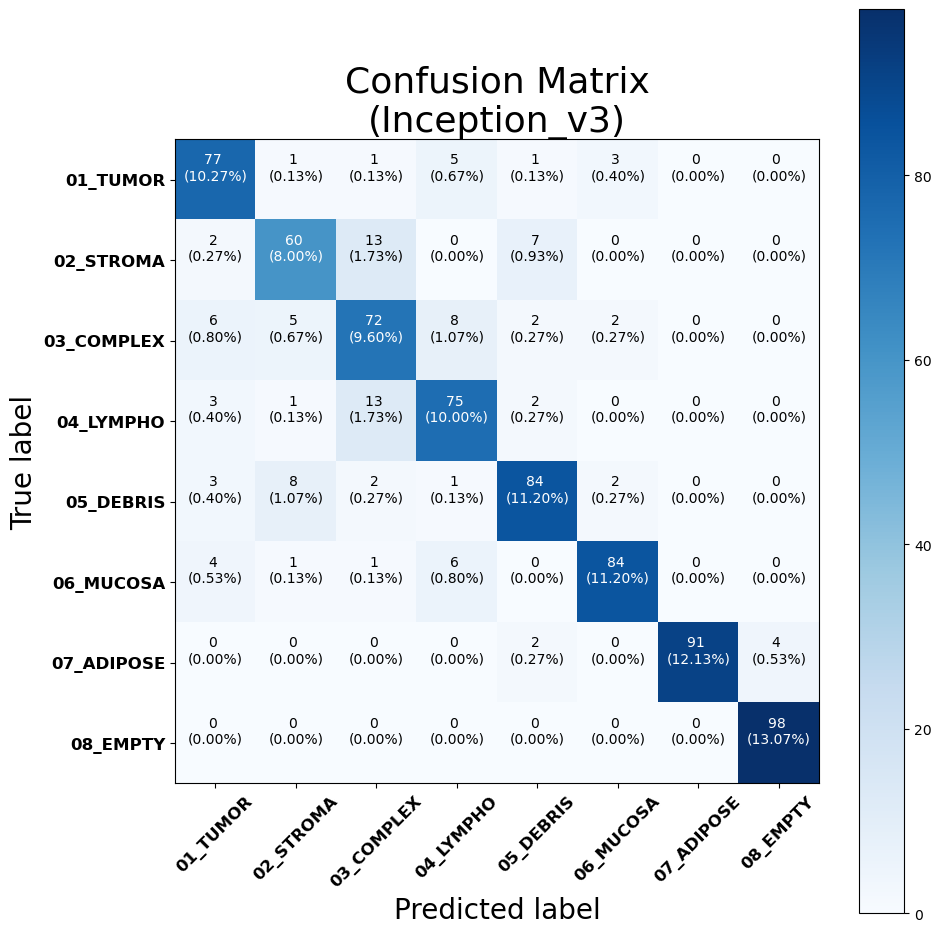

In [56]:
cm_inception = confusion_matrix(pred_df_inception.true_label, pred_df_inception.prediction)
plot_confusion_matrix(cm_inception, classes, title = 'Confusion Matrix\n(Inception_v3)')

The results obtained at this level with Inceptron_V3 can however be improved by adding another fully connected layer before the classifier of Inception_v3

# Classification results for a randomly panel

Now let's try to display the classification results for a panel of randomly selected images from the test dataset. 

In [57]:
def plot_image(i, paths, labels_array, ps_darray, classes):
    img_path = paths[i]
    plt.imshow(readImage_rgb(img_path))
    plt.xticks([])
    plt.yticks([])
    
    pred = np.argmax(ps_darray[i])
    if pred == labels_array[i]:
        color = 'blue'
    else:
        color = 'red'
    plt.xlabel('pred: {} ({:.2f}%)\ntrue_label: {}'.format(classes[pred], np.max(ps_darray[i])*100, classes[labels_array[i]]), color = color)

def plot_classification(i, labels_array, ps_darray, classes):
    thisplot = plt.barh(np.arange(len(classes)), ps_darray[i], color = '#777777')
    plt.yticks(np.arange(len(classes)), classes)
    plt.xlim(0,1)
    plt.xlabel('probability')
    plt.ylabel('classes')
    pred = np.argmax(ps_darray[i])
    thisplot[pred].set_color('red')
    thisplot[labels_array[i]].set_color('blue')

In [58]:
images, labels, paths = next(iter(test_loader))
with torch.no_grad():
    inception.eval()
    output = inception(images)
    softmax = nn.Softmax(dim=1)
    ps = softmax(output)
    labels_array = labels.numpy().squeeze()
    ps_darray = ps.numpy().squeeze()

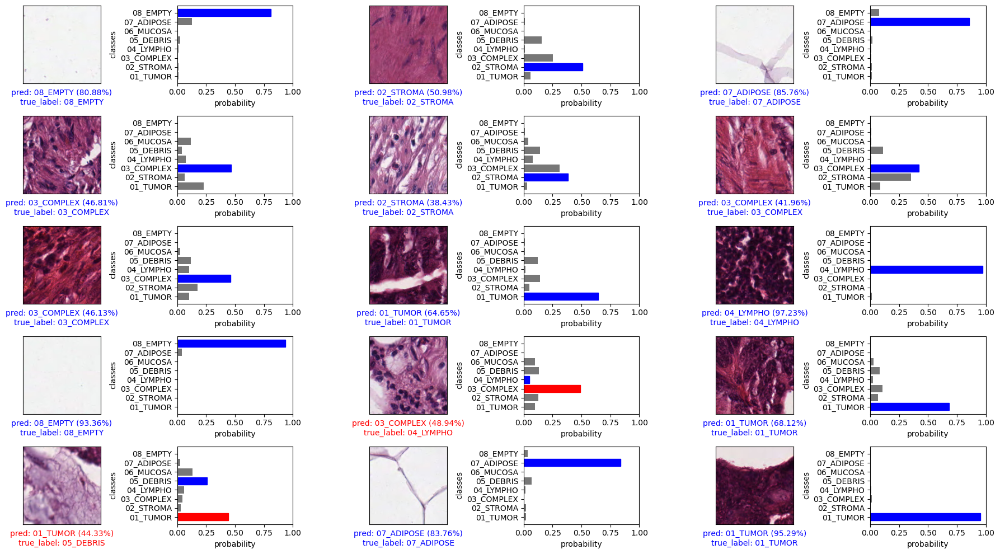

In [59]:
# View a panel of images in the testing set
num_rows = 5
num_cols = 3
plt.figure(figsize=(3*2*num_cols,2*num_rows))
for i in np.arange(15):
    plt.subplot(num_rows, num_cols*2, 2*i+1)
    plot_image(i, paths, labels_array, ps_darray, classes)
    plt.subplot(num_rows, num_cols*2, 2*i+2)
    plot_classification(i, labels_array, ps_darray, classes)
plt.tight_layout()

# Conclusion

### 1. Analyze summary 

At the end of this study, we can the machine learning and deep learning methods used have been very useful to understand the phenomenon studied and the correlations that exist between the different classes. The convolutional network model implemented allowed us to obtain a good prediction score on all the test images at 25 trained epochs (~81%). However, by continuing our study with the pre-trained Inception_v3 model, we were able to obtain an overall accuracy of (~88%) on 8 different tissue types. This is a testament to the high performance of this algorithm.

As we have seen, the model is very effective at classifying classes that have a distinct pixel distribution pattern, such as the "ADIPOSE" and "EMPTY" classes. As for the "STROMA" and "COMPLEX" classes, the accuracy of the is relatively low, and according to the confusion matrix, a large portion of the images misclassified in these two classes are found in the other class. This may well be due to their similarities ("STROMA" and "COMPLEX" classes are by definition stromas). Hence, it is understandable that it is difficult to classify these two classes.

### 2. Model inconvenients et perpectives

One of the drawbacks of the approaches used is that the prediction made is based on a defined area of 150x150px, and it is possible that a certain area contains several different cell/tissue types. For example, it is well known that tumor-immunity/tumor-stroma interactions play an important role in tumor progression. This is because the mucosa itself contains immune cells and multiple other cell types. 

Therefore, one solution would be to use a broader classification criterion instead of trying to refine the tissue categories into 8 different classes. Classes such as STROMA and COMPLEX can be combined for better results. In addition, attention should be paid to image selection for the training and validation datasets: images with multiple cell types should be eliminated to avoid potential misclassification.

# Codes references

https://github.com/pytorch/vision/blob/6db1569c89094cf23f3bc41f79275c45e9fcb3f3/torchvision/models/inception.py#L64